# Problem Statement : To determine whether a patient admitted to an ICU has been diagnosed with a particular type of diabetes, Diabetes Mellitus

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as pl
import plotly.express as px
from sklearn import metrics
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, precision_recall_curve, classification_report, average_precision_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from fancyimpute import IterativeImputer as MICE

In [2]:
train_df = pd.read_csv('./TrainingWiDS2021.csv')
test_df =  pd.read_csv('./UnlabeledWiDS2021.csv')

### Help to display complete output without truncation

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

/Users/poojaholkar/.pyenv/versions/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  after removing the cwd from sys.path.


### Plot to understand diabetes_mellitus range of affected and not affected 

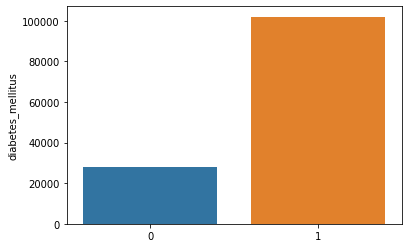

In [4]:

sns.barplot(x = train_df['diabetes_mellitus'].unique(),y = train_df['diabetes_mellitus'].value_counts())

In [5]:
train_df['diabetes_mellitus'].value_counts()

0    102006
1    28151 
Name: diabetes_mellitus, dtype: int64

### null values columns count

In [6]:
def null_check(data_set,data_set_name):
    null_count = data_set.isnull().sum()
    null_count_percent = data_set.isnull().sum()*100/len(data_set)
    print("No. of columns with null values in {} dataset : {}".format(data_set_name,len(null_count_percent)))
    return null_count_percent,null_count

train_null_col,train_null_count = null_check(train_df,"Training")  
test_null_col,test_null_count = null_check(test_df,"Testing")

No. of columns with null values in Training dataset : 181
No. of columns with null values in Testing dataset : 180


### Columns having more than 50% of NaN

In [7]:
(train_df.isnull().sum() / len(train_df) * 100 > 50).value_counts()

False    108
True     73 
dtype: int64

In [8]:
train_df.head()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
0,1,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,NaN,0,14.1,46.0,32.0,68.0,37.0,68.0,37.0,119.0,72.0,66.0,40.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,122.0,64.0,131.0,73.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,68.0,63.0,119.0,108.0,NaN,NaN,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,NaN,NaN,131.0,115.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,NaN,NaN,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,1
1,2,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45,33.0,145.0,35.1,NaN,1,12.7,NaN,NaN,95.0,31.0,95.0,31.0,118.0,72.0,NaN,NaN,1

### Gender based plot to understand whch genders are more prone to diabetes_mellitus

In [9]:
gen_dm = px.histogram(train_df, x='gender', y='diabetes_mellitus', width = 500, height = 400)
gen_dm.update_layout(title='gender vs diabetes')
gen_dm.show()

### Top 30 age bars most prone to diabetes_mellitus

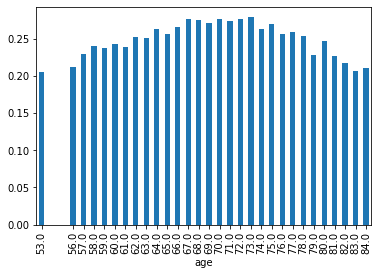

In [10]:
train_df.groupby('age').mean()['diabetes_mellitus'].nlargest(30).plot(kind='bar')

### Pattern of  different ethnictes getting affected with diabetes_mellitus

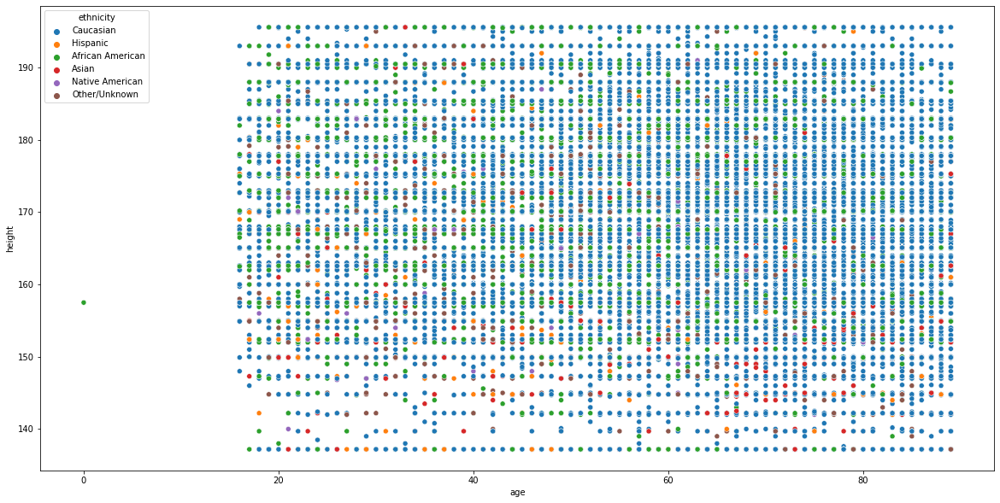

In [11]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=train_df, x="age", y="height", hue="ethnicity")

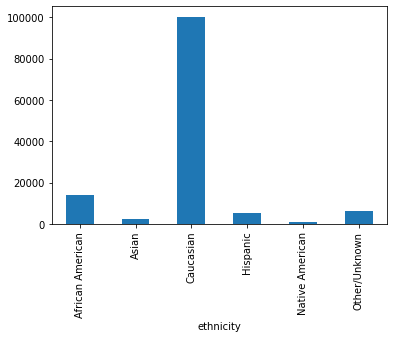

In [12]:
train_df.groupby('ethnicity').count()['diabetes_mellitus'].plot(kind='bar')


### Percentage count of diabetes_mellitus patients based on ethnicity

In [13]:
pd.crosstab(train_df.ethnicity, train_df.diabetes_mellitus,normalize='index')


diabetes_mellitus,0,1
ethnicity,,
African American,0.737330,0.262670
Asian,0.755232,0.244768
Caucasian,0.794435,0.205565
Hispanic,0.753813,0.246187
Native American,0.678689,0.321311
Other/Unknown,0.745248,0.254752


### Patients affected by diabetes_mellitus w.r.t Age

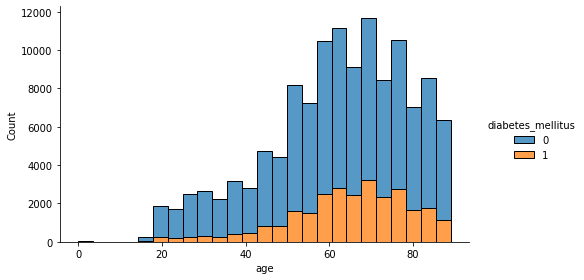

In [14]:
sns.displot(data = train_df, kind = 'hist', x = 'age', hue = 'diabetes_mellitus', multiple = 'stack',bins=25,height = 4, aspect = 1.7)


### Deleting columns having nan values more than 40% and also the id columns which doesnot add value to analysis for Train Data

In [15]:
#train dataset 
df_train=train_df.dropna(axis=1, thresh=(1-0.4) * len(train_df))
col_drop = ['hospital_id','icu_id','icu_stay_type','icu_type','hospital_admit_source','icu_admit_source','pre_icu_los_days','readmission_status']
for col in col_drop:
    del df_train[col]
print("List of dropped columns:", end=" ")
for c in train_df.columns:
    if c not in df_train.columns:
        print(c, end=", ")
print('\n')

List of dropped columns: hospital_id, hospital_admit_source, icu_admit_source, icu_id, icu_stay_type, icu_type, pre_icu_los_days, readmission_status, albumin_apache, bilirubin_apache, fio2_apache, paco2_apache, paco2_for_ph_apache, pao2_apache, ph_apache, urineoutput_apache, d1_diasbp_invasive_max, d1_diasbp_invasive_min, d1_mbp_invasive_max, d1_mbp_invasive_min, d1_sysbp_invasive_max, d1_sysbp_invasive_min, h1_diasbp_invasive_max, h1_diasbp_invasive_min, h1_mbp_invasive_max, h1_mbp_invasive_min, h1_sysbp_invasive_max, h1_sysbp_invasive_min, d1_albumin_max, d1_albumin_min, d1_bilirubin_max, d1_bilirubin_min, d1_inr_max, d1_inr_min, d1_lactate_max, d1_lactate_min, h1_albumin_max, h1_albumin_min, h1_bilirubin_max, h1_bilirubin_min, h1_bun_max, h1_bun_min, h1_calcium_max, h1_calcium_min, h1_creatinine_max, h1_creatinine_min, h1_glucose_max, h1_glucose_min, h1_hco3_max, h1_hco3_min, h1_hemaglobin_max, h1_hemaglobin_min, h1_hematocrit_max, h1_hematocrit_min, h1_inr_max, h1_inr_min, h1_lacta

##### Deleting columns having nan values more than 40% and also the id columns which doesnot add value to analysis for Test Data


In [16]:
#test dataset 

df_test=test_df.dropna(axis=1, thresh=(1-0.4) * len(test_df))
col_drop = ['hospital_id','icu_id','icu_stay_type','icu_type','hospital_admit_source','icu_admit_source','pre_icu_los_days','readmission_status']
for col in col_drop:
    del df_test[col]
print("List of dropped columns:", end=" ")
for c in test_df.columns:
    if c not in df_test.columns:
        print(c, end=", ")
print('\n')

List of dropped columns: hospital_id, hospital_admit_source, icu_admit_source, icu_id, icu_stay_type, icu_type, pre_icu_los_days, readmission_status, albumin_apache, bilirubin_apache, fio2_apache, paco2_apache, paco2_for_ph_apache, pao2_apache, ph_apache, urineoutput_apache, d1_diasbp_invasive_max, d1_diasbp_invasive_min, d1_mbp_invasive_max, d1_mbp_invasive_min, d1_sysbp_invasive_max, d1_sysbp_invasive_min, h1_diasbp_invasive_max, h1_diasbp_invasive_min, h1_mbp_invasive_max, h1_mbp_invasive_min, h1_sysbp_invasive_max, h1_sysbp_invasive_min, d1_albumin_max, d1_albumin_min, d1_bilirubin_max, d1_bilirubin_min, d1_inr_max, d1_inr_min, d1_lactate_max, d1_lactate_min, h1_albumin_max, h1_albumin_min, h1_bilirubin_max, h1_bilirubin_min, h1_bun_max, h1_bun_min, h1_calcium_max, h1_calcium_min, h1_creatinine_max, h1_creatinine_min, h1_glucose_max, h1_glucose_min, h1_hco3_max, h1_hco3_min, h1_hemaglobin_max, h1_hemaglobin_min, h1_hematocrit_max, h1_hematocrit_min, h1_inr_max, h1_inr_min, h1_lacta

### Missing data in columns with their percentage

In [17]:
def missing_data(train):
    missing_values = train.isnull().sum()
    missing_value_percentage = train.isnull().sum() / len(train) * 100
    missing_data_df = pd.concat([missing_values, missing_value_percentage], axis=1)
    missing_data_df = missing_data_df.rename(columns = {0 : 'Missing_values', 1 : 'Missing_values_percentage'})
    missing_data_df = missing_data_df.sort_values(by=['Missing_values_percentage'], ascending=False)
    return missing_data_df

In [18]:
missing_data(df_train)

,Missing_values,Missing_values_percentage
h1_temp_max,29703,22.820901
h1_temp_min,29703,22.820901
wbc_apache,29475,22.645728
hematocrit_apache,26758,20.558249
bun_apache,25411,19.523345
creatinine_apache,24882,19.116913
sodium_apache,24519,18.838019
d1_hco3_max,20047,15.402168
d1_hco3_min,20047,15.402168
d1_platelets_min,18557,14.257397


In [19]:
missing_data(df_test)

,Missing_values,Missing_values_percentage
h1_temp_max,2654,25.933164
h1_temp_min,2654,25.933164
wbc_apache,2376,23.216729
hematocrit_apache,2114,20.656635
bun_apache,2061,20.138753
creatinine_apache,2043,19.962869
sodium_apache,1993,19.474301
d1_hco3_min,1594,15.575533
d1_hco3_max,1594,15.575533
d1_wbc_max,1422,13.894860


##### converting the categorical column into a numerical one using get_dummies method that creates a dummy variable for each categorical variable.



In [20]:
#categoricl variables
df_train.select_dtypes(include = ['O']).columns

Index(['ethnicity', 'gender'], dtype='object')

In [21]:
df_test.select_dtypes(include = ['O']).columns

Index(['ethnicity', 'gender'], dtype='object')

In [22]:
df_train.head()

,Unnamed: 0,encounter_id,age,bmi,elective_surgery,ethnicity,gender,height,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
0,1,214826,68.0,22.732803,0,Caucasian,M,180.3,73.9,113.0,502.01,0,0,31.0,2.51,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,36.0,134.0,39.3,0,14.1,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.0,63.0,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,131.0,115.0,39.5,37.5,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,0,0,0,0,0,0,0,1
1,2,246060,77.0,27.421875,0,Caucasian,F,160.0,70.2,108.0,203.01,0,0,9.0,0.56,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,33.0,145.0,35.1,1,12.7,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.0,48.0,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,95.0,71.0,36.3,36.3,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,23.3,12.7,0,0,0,0,0,0,0,1
2,3,276985,25.0,31.952749,0,Caucasian,F,172.7,95.3,122.0,703.03,0,0,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,37.0,NaN,36.7,0,NaN,88.0,48.0,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,148.0,105.0,37.0,36.7,88.0,58.0,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,148.0,124.0,36.7,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0
3,4,262220,81.0,22.635548,1,Caucasian,F,165.1,61.7,203.0,1206.03,1,0,NaN,NaN,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1,60.0,4.0,NaN,34.8,1,8.0,48.0,42.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,158.0,84.0,38.0,34.8,62.0,44.0,NaN,NaN,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,NaN,NaN,35.6,34.8,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.0,5.0,3.5,NaN,NaN,9.0,8.0,0,0,0,0,0,0,0,0
4,5,201746,19.0,NaN,0,Caucasian,M,188.0,NaN,119.0,601.01,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,NaN,0,103.0,16.0,NaN,36.7,0,NaN,99.0,57.0,99.0,57.0,89.0,60.0,104.0,90.0,104.0,90.0,18.0,16.0,100.0,96.0,147.0,120.0,147.0,120.0,37.2,36.7,99.0,68.0,99.0,68.0,89.0,76.0,104.0,92.0,104.0,92.0,NaN,NaN,100.0,100.0,130.0,120.0,130.0,120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0


In [23]:
dummies = pd.get_dummies(df_train[['ethnicity','gender']],columns = ['ethnicity','gender'],prefix=['ethnicity','gender'],drop_first=True).head()
dummies.head()


,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M
0,0,1,0,0,0,1
1,0,1,0,0,0,0
2,0,1,0,0,0,0
3,0,1,0,0,0,0
4,0,1,0,0,0,1


In [24]:
columns = ['ethnicity','gender']
df_train = pd.concat([df_train,dummies],axis=1)
df_train.drop(columns,axis=1,inplace=True)
df_train.head()

,Unnamed: 0,encounter_id,age,bmi,elective_surgery,height,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M
0,1,214826,68.0,22.732803,0,180.3,73.9,113.0,502.01,0,0,31.0,2.51,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,36.0,134.0,39.3,0,14.1,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.0,63.0,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,131.0,115.0,39.5,37.5,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,0,0,0,0,0,0,0,1,0.0,1.0,0.0,0.0,0.0,1.0
1,2,246060,77.0,27.421875,0,160.0,70.2,108.0,203.01,0,0,9.0,0.56,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,33.0,145.0,35.1,1,12.7,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.0,48.0,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,95.0,71.0,36.3,36.3,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,23.3,12.7,0,0,0,0,0,0,0,1,0.0,1.0,0.0,0.0,0.0,0.0
2,3,276985,25.0,31.952749,0,172.7,95.3,122.0,703.03,0,0,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0,68.0,37.0,NaN,36.7,0,NaN,88.0,48.0,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,148.0,105.0,37.0,36.7,88.0,58.0,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,148.0,124.0,36.7,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0
3,4,262220,81.0,22.635548,1,165.1,61.7,203.0,1206.03,1,0,NaN,NaN,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1,60.0,4.0,NaN,34.8,1,8.0,48.0,42.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,158.0,84.0,38.0,34.8,62.0,44.0,NaN,NaN,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,NaN,NaN,35.6,34.8,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.0,5.0,3.5,NaN,NaN,9.0,8.0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0
4,5,201746,19.0,NaN,0,188.0,NaN,119.0,601.01,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,NaN,0,103.0,16.0,NaN,36.7,0,NaN,99.0,57.0,99.0,57.0,89.0,60.0,104.0,90.0,104.0,90.0,18.0,16.0,100.0,96.0,147.0,120.0,147.0,120.0,37.2,36.7,99.0,68.0,99.0,68.0,89.0,76.0,104.0,92.0,104.0,92.0,NaN,NaN,100.0,100.0,130.0,120.0,130.0,120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,1.0


In [25]:
dummies = pd.get_dummies(df_test[['ethnicity','gender']],columns = ['ethnicity','gender'],prefix=['ethnicity','gender'],drop_first=True).head()
columns = ['ethnicity','gender']
df_test = pd.concat([df_test,dummies],axis=1)
df_test.drop(columns,axis=1,inplace=True)
df_test.head()

,Unnamed: 0,encounter_id,age,bmi,elective_surgery,height,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M
0,1,144740,72,NaN,0,152.4,NaN,110.0,104.01,0,0,44.0,1.49,4.0,6.0,0.0,5.0,97.0,38.0,39.9,0,54.0,31.0,130.0,36.4,0,5.4,104.0,40.0,104.0,40.0,66.0,38.0,123.0,54.0,123.0,54.0,35.0,15.0,100.0,96.0,149.0,76.0,149.0,76.0,38.7,35.6,59.0,59.0,59.0,59.0,46.0,44.0,80.0,80.0,80.0,80.0,19.0,19.0,97.0,96.0,116.0,116.0,116.0,116.0,36.4,36.4,44.0,40.0,9.8,9.3,1.49,1.44,104.0,97.0,26.0,23.0,14.5,14.2,42.8,39.9,173.0,173.0,5.7,4.9,132.0,130.0,5.6,5.4,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0
1,2,141990,86,NaN,0,175.3,NaN,117.0,106.01,0,0,19.0,0.92,4.0,6.0,0.0,5.0,73.0,116.0,NaN,0,41.0,53.0,142.0,36.3,0,NaN,101.0,27.0,101.0,27.0,116.0,56.0,129.0,41.0,129.0,41.0,51.0,14.0,100.0,95.0,181.0,65.0,181.0,65.0,36.8,36.4,85.0,65.0,85.0,65.0,116.0,104.0,129.0,94.0,129.0,94.0,31.0,24.0,97.0,95.0,181.0,119.0,181.0,119.0,36.7,36.7,19.0,19.0,8.5,8.5,1.00,1.00,102.0,73.0,27.0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,3.9,3.8,144.0,144.0,NaN,NaN,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0
2,3,142038,72,NaN,0,162.6,NaN,302.0,109.01,0,0,24.0,0.77,4.0,6.0,0.0,5.0,84.0,104.0,34.8,0,117.0,38.0,137.0,36.4,0,4.6,97.0,61.0,97.0,61.0,98.0,68.0,117.0,77.0,117.0,77.0,49.0,8.0,99.0,85.0,146.0,103.0,146.0,103.0,36.9,35.9,97.0,97.0,97.0,97.0,98.0,92.0,117.0,117.0,117.0,117.0,20.0,20.0,99.0,96.0,146.0,146.0,146.0,146.0,36.4,36.4,24.0,16.0,9.1,8.5,0.82,0.77,141.0,84.0,32.0,31.0,11.8,11.5,36.6,34.8,253.0,243.0,3.6,3.6,141.0,137.0,6.6,4.6,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0
3,4,138628,66,NaN,0,177.8,NaN,113.0,501.05,0,0,NaN,NaN,4.0,6.0,0.0,4.0,NaN,110.0,NaN,0,61.0,56.0,NaN,36.6,1,NaN,77.0,51.0,77.0,51.0,110.0,86.0,110.0,61.0,110.0,61.0,56.0,19.0,99.0,80.0,145.0,95.0,145.0,95.0,37.8,36.6,NaN,NaN,NaN,NaN,107.0,95.0,NaN,NaN,NaN,NaN,56.0,28.0,95.0,90.0,NaN,NaN,NaN,NaN,37.8,37.0,27.0,27.0,9.0,9.0,1.55,1.55,84.0,84.0,24.0,24.0,10.8,10.8,34.3,34.3,303.0,303.0,4.1,4.1,136.0,136.0,24.8,24.8,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,1.0
4,5,141682,89,NaN,0,170.2,NaN,117.0,106.01,0,0,26.0,1.50,4.0,6.0,0.0,5.0,99.0,34.0,33.0,0,136.0,35.0,133.0,36.5,0,5.2,88.0,49.0,88.0,49.0,58.0,34.0,136.0,71.0,136.0,71.0,49.0,9.0,100.0,93.0,194.0,114.0,194.0,114.0,36.7,35.8,70.0,66.0,70.0,66.0,48.0,44.0,102.0,89.0,102.0,89.0,26.0,20.0,97.0,94.0,145.0,142.0,145.0,142.0,36.6,36.6,26.0,25.0,8.8,8.6,1.50,1.30,159.0,99.0,33.0,30.0,10.8,10.7,34.2,33.0,157.0,154.0,4.0,3.9,136.0,133.0,6.2,5.2,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,1.0


In [26]:
x = df_train.drop('diabetes_mellitus', axis=1)
y = df_train['diabetes_mellitus']

### It is important to understand the distribution of features and only then impute the null values and replace with appropriate statistical imputers based on the distribution and outliers


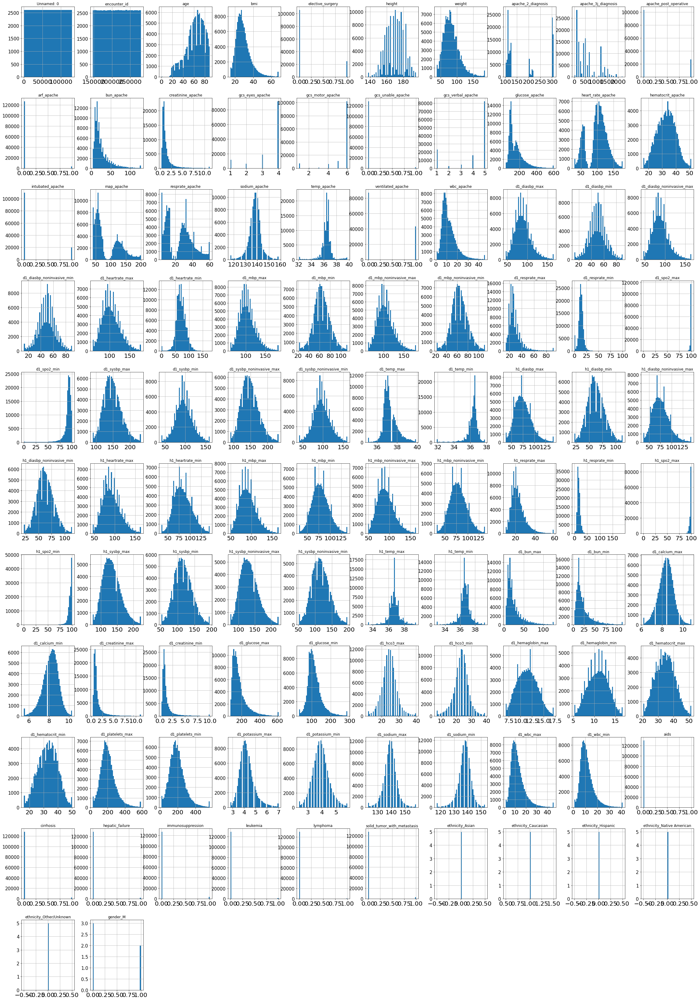

In [27]:
x.hist(figsize=(40, 60), bins=50, xlabelsize=20, ylabelsize=15);

### From the below distribution we know there are good numbers of variables which are distribted normally or slighltly skewed .For such distributions we will use MICE to impute values and for distributions which are ordinal we will impute by mode.

#### Impute the missing values.

In [28]:
X_imputed = MICE(verbose=False).fit_transform(x)
X_imputed_df = pd.DataFrame(X_imputed, columns = x.columns)

### mode imputation

In [29]:

x['gcs_eyes_apache']= x['gcs_eyes_apache'].fillna(value=x['gcs_eyes_apache'].mode()[0])
x['gcs_motor_apache']= x['gcs_motor_apache'].fillna(value=x['gcs_motor_apache'].mode()[0])
x['gcs_unable_apache']= x['gcs_unable_apache'].fillna(value=x['gcs_unable_apache'].mode()[0])
x['gcs_verbal_apache']= x['gcs_verbal_apache'].fillna(value=x['gcs_verbal_apache'].mode()[0])

In [30]:
x['gcs_unable_apache'].isnull().sum()

0

In [31]:
X_impute = X_imputed_df.drop(columns=['gcs_eyes_apache','gcs_motor_apache','gcs_unable_apache','gcs_verbal_apache'],axis=1)


In [32]:
X_impute.head()

,Unnamed: 0,encounter_id,age,bmi,elective_surgery,height,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M
0,1.0,214826.0,68.0,22.732803,0.0,180.3,73.900000,113.0,502.01,0.0,0.0,31.000000,2.510000,168.000000,118.0,27.400000,0.0,40.0,36.0,134.000000,39.3,0.0,14.100000,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.0,63.0,68.000000,63.000000,119.0,108.0,86.0,85.0,86.000000,85.000000,26.000000,18.000000,100.0,74.0,131.0,115.0,131.000000,115.000000,39.500000,37.50000,31.000000,30.000000,8.500000,7.400000,2.510000,2.230000,168.000000,109.000000,19.000000,15.000000,8.900000,8.900000,27.400000,27.400000,233.000000,233.000000,4.000000,3.400000,136.000000,134.000000,14.100000,14.100000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,2.0,246060.0,77.0,27.421875,0.0,160.0,70.200000,108.0,203.01,0.0,0.0,9.000000,0.560000,145.000000,120.0,36.900000,0.0,46.0,33.0,145.000000,35.1,1.0,12.700000,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.0,48.0,61.000000,48.000000,114.0,100.0,85.0,57.0,85.000000,57.000000,31.000000,28.000000,95.0,70.0,95.0,71.0,95.000000,71.000000,36.300000,36.30000,11.000000,9.000000,8.600000,8.000000,0.710000,0.560000,145.000000,128.000000,27.000000,26.000000,11.300000,11.100000,36.900000,36.100000,557.000000,487.000000,4.200000,3.800000,145.000000,145.000000,23.300000,12.700000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,3.0,276985.0,25.0,31.952749,0.0,172.7,95.300000,122.0,703.03,0.0,0.0,25.275023,1.472294,158.417516,102.0,33.150114,0.0,68.0,37.0,137.939004,36.7,0.0,11.709246,88.0,48.0,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,148.0,105.0,37.0,36.7,88.0,58.0,88.000000,58.000000,96.0,78.0,91.0,83.0,91.000000,83.000000,20.000000,16.000000,98.0,91.0,148.0,124.0,148.000000,124.000000,36.700000,36.70000,25.726184,23.051451,8.303857,8.154322,1.507639,1.357911,172.398801,109.581545,24.301721,22.640865,11.471565,11.071656,34.178602,33.059968,201.405170,196.620217,4.168736,3.919703,139.130530,137.849204,11.912003,11.393539,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,4.0,262220.0,81.0,22.635548,1.0,165.1,61.700000,203.0,1206.03,1.0,0.0,26.783163,1.434350,185.000000,114.0,25.900000,1.0,60.0,4.0,138.173501,34.8,1.0,8.000000,48.0,42.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,158.0,84.0,38.0,34.8,62.0,44.0,62.952354,45.446049,100.0,96.0,92.0,71.0,92.477721,71.673541,12.000000,11.000000,100.0,99.0,136.0,106.0,136.782428,106.794347

In [33]:
X = pd.merge(X_impute, x[["Unnamed: 0", "gcs_eyes_apache", "gcs_motor_apache","gcs_unable_apache","gcs_verbal_apache"]], on="Unnamed: 0", how="left")
X.drop('Unnamed: 0', axis = 1, inplace = True)

In [34]:
X.head()

,encounter_id,age,bmi,elective_surgery,height,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache
0,214826.0,68.0,22.732803,0.0,180.3,73.900000,113.0,502.01,0.0,0.0,31.000000,2.510000,168.000000,118.0,27.400000,0.0,40.0,36.0,134.000000,39.3,0.0,14.100000,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.0,63.0,68.000000,63.000000,119.0,108.0,86.0,85.0,86.000000,85.000000,26.000000,18.000000,100.0,74.0,131.0,115.0,131.000000,115.000000,39.500000,37.50000,31.000000,30.000000,8.500000,7.400000,2.510000,2.230000,168.000000,109.000000,19.000000,15.000000,8.900000,8.900000,27.400000,27.400000,233.000000,233.000000,4.000000,3.400000,136.000000,134.000000,14.100000,14.100000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,6.0,0.0,4.0
1,246060.0,77.0,27.421875,0.0,160.0,70.200000,108.0,203.01,0.0,0.0,9.000000,0.560000,145.000000,120.0,36.900000,0.0,46.0,33.0,145.000000,35.1,1.0,12.700000,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.0,48.0,61.000000,48.000000,114.0,100.0,85.0,57.0,85.000000,57.000000,31.000000,28.000000,95.0,70.0,95.0,71.0,95.000000,71.000000,36.300000,36.30000,11.000000,9.000000,8.600000,8.000000,0.710000,0.560000,145.000000,128.000000,27.000000,26.000000,11.300000,11.100000,36.900000,36.100000,557.000000,487.000000,4.200000,3.800000,145.000000,145.000000,23.300000,12.700000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,1.0
2,276985.0,25.0,31.952749,0.0,172.7,95.300000,122.0,703.03,0.0,0.0,25.275023,1.472294,158.417516,102.0,33.150114,0.0,68.0,37.0,137.939004,36.7,0.0,11.709246,88.0,48.0,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,148.0,105.0,37.0,36.7,88.0,58.0,88.000000,58.000000,96.0,78.0,91.0,83.0,91.000000,83.000000,20.000000,16.000000,98.0,91.0,148.0,124.0,148.000000,124.000000,36.700000,36.70000,25.726184,23.051451,8.303857,8.154322,1.507639,1.357911,172.398801,109.581545,24.301721,22.640865,11.471565,11.071656,34.178602,33.059968,201.405170,196.620217,4.168736,3.919703,139.130530,137.849204,11.912003,11.393539,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,6.0,0.0,5.0
3,262220.0,81.0,22.635548,1.0,165.1,61.700000,203.0,1206.03,1.0,0.0,26.783163,1.434350,185.000000,114.0,25.900000,1.0,60.0,4.0,138.173501,34.8,1.0,8.000000,48.0,42.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,158.0,84.0,38.0,34.8,62.0,44.0,62.952354,45.446049,100.0,96.0,92.0

#### Imputation for test data

In [35]:
from fancyimpute import IterativeImputer as MICE
test_imputed = MICE(verbose=False).fit_transform(df_test)

In [36]:
test_imputed_df = pd.DataFrame(test_imputed, columns = df_test.columns)

In [37]:
#mode imputation
df_test['gcs_eyes_apache']= df_test['gcs_eyes_apache'].fillna(value=df_test['gcs_eyes_apache'].mode()[0])
df_test['gcs_motor_apache']= df_test['gcs_motor_apache'].fillna(value=df_test['gcs_motor_apache'].mode()[0])
df_test['gcs_unable_apache']= df_test['gcs_unable_apache'].fillna(value=df_test['gcs_unable_apache'].mode()[0])
df_test['gcs_verbal_apache']= df_test['gcs_verbal_apache'].fillna(value=df_test['gcs_verbal_apache'].mode()[0])

In [38]:
test_impute = test_imputed_df.drop(columns=['gcs_eyes_apache','gcs_motor_apache','gcs_unable_apache','gcs_verbal_apache'],axis=1)

In [39]:
test_data = pd.merge(test_impute, df_test[["Unnamed: 0", "gcs_eyes_apache", "gcs_motor_apache","gcs_unable_apache","gcs_verbal_apache"]], on="Unnamed: 0", how="left")
test_data.drop('Unnamed: 0', axis = 1, inplace = True)
test_data.head()

,encounter_id,age,bmi,elective_surgery,height,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache
0,144740.0,72.0,29.202947,0.0,152.4,66.262405,110.0,104.01,0.0,0.0,44.000000,1.490000,97.000000,38.0,39.900000,0.0,54.0,31.0,130.000000,36.4,0.0,5.400000,104.0,40.0,104.0,40.0,66.0,38.0,123.0,54.0,123.0,54.0,35.0,15.0,100.0,96.0,149.0,76.0,149.0,76.0,38.7,35.6,59.000000,59.000000,59.000000,59.000000,46.0,44.0,80.00000,80.000000,80.000000,80.000000,19.0,19.0,97.0,96.0,116.000000,116.000000,116.000000,116.000000,36.4,36.4,44.0,40.0,9.8,9.3,1.49,1.44,104.0,97.0,26.0,23.0,14.500000,14.200,42.800000,39.900000,173.000000,173.000000,5.7,4.9,132.0,130.0,5.60000,5.400000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,0.0,5.0
1,141990.0,86.0,28.793947,0.0,175.3,87.817103,117.0,106.01,0.0,0.0,19.000000,0.920000,73.000000,116.0,33.331167,0.0,41.0,53.0,142.000000,36.3,0.0,11.323486,101.0,27.0,101.0,27.0,116.0,56.0,129.0,41.0,129.0,41.0,51.0,14.0,100.0,95.0,181.0,65.0,181.0,65.0,36.8,36.4,85.000000,65.000000,85.000000,65.000000,116.0,104.0,129.00000,94.000000,129.000000,94.000000,31.0,24.0,97.0,95.0,181.000000,119.000000,181.000000,119.000000,36.7,36.7,19.0,19.0,8.5,8.5,1.00,1.00,102.0,73.0,27.0,27.0,11.437005,10.883,35.009011,33.368558,202.383191,191.207332,3.9,3.8,144.0,144.0,11.99516,10.982048,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,0.0,5.0
2,142038.0,72.0,29.043185,0.0,162.6,76.170816,302.0,109.01,0.0,0.0,24.000000,0.770000,84.000000,104.0,34.800000,0.0,117.0,38.0,137.000000,36.4,0.0,4.600000,97.0,61.0,97.0,61.0,98.0,68.0,117.0,77.0,117.0,77.0,49.0,8.0,99.0,85.0,146.0,103.0,146.0,103.0,36.9,35.9,97.000000,97.000000,97.000000,97.000000,98.0,92.0,117.00000,117.000000,117.000000,117.000000,20.0,20.0,99.0,96.0,146.000000,146.000000,146.000000,146.000000,36.4,36.4,24.0,16.0,9.1,8.5,0.82,0.77,141.0,84.0,32.0,31.0,11.800000,11.500,36.600000,34.800000,253.000000,243.000000,3.6,3.6,141.0,137.0,6.60000,4.600000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,0.0,5.0
3,138628.0,66.0,28.957928,0.0,177.8,91.248194,113.0,501.05,0.0,0.0,27.462629,1.561529,69.118448,110.0,34.041566,0.0,61.0,56.0,136.010372,36.6,1.0,25.597249,77.0,51.0,77.0,51.0,110.0,86.0,110.0,61.0,110.0,61.0,56.0,19.0,99.0,80.0,145.0,95.0,145.0,95.0,37.8,36.6,74.798332,62.167906,74.630567,62.088936,107.0,95.0,91.96863,78.583905,91.971399,78.769904,56.0,28.0,95.0,90.0,132.363828,115.427561,132.520264,115.699856,37.8,37.0,27.0,27.0,9.0,9.0,1.55,1.55,84.0,84.0,24.0,24.0,10.800000,10.

### Understanding highly correlated features

In [40]:
df_corr=X.corr(method ='pearson')
corr_matrix = df_corr[df_corr>=.8]
corr_matrix.head()

,encounter_id,age,bmi,elective_surgery,height,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache
encounter_id,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bmi,NaN,NaN,1.0,NaN,NaN,0.875412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
elective_surgery,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,0.909573,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
height,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)]= True

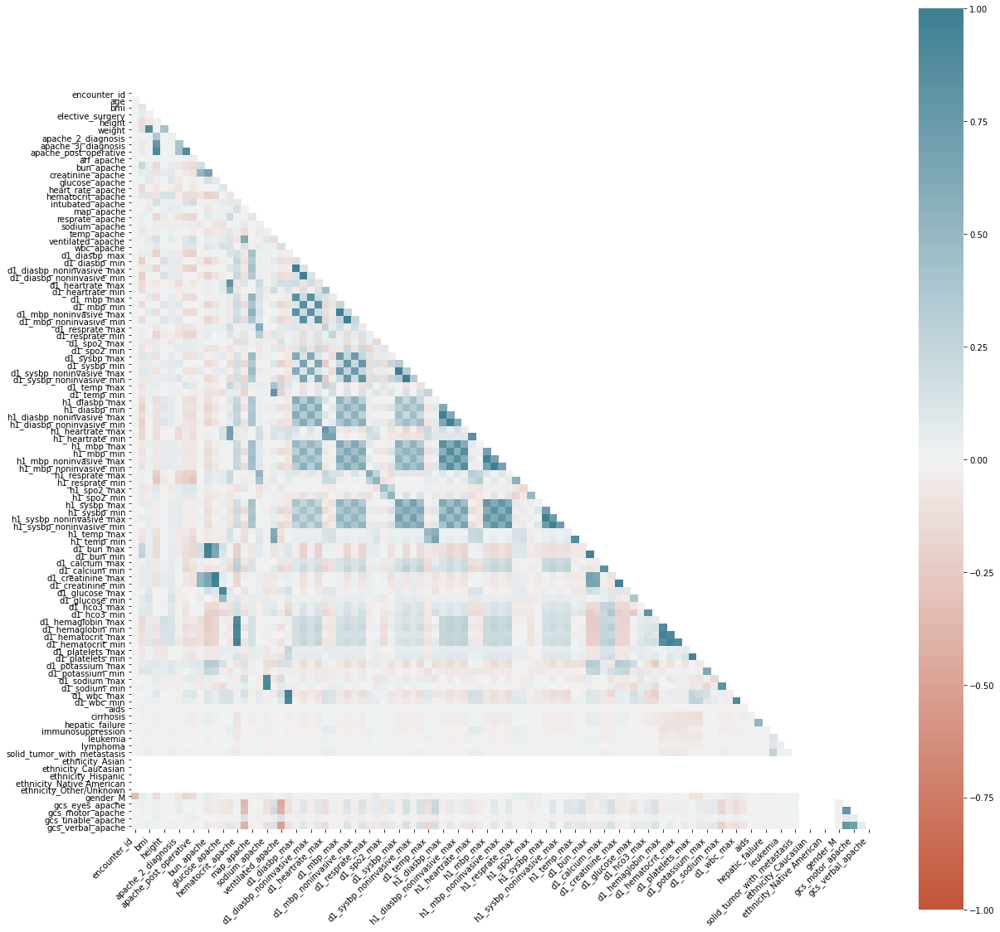

In [42]:
plt.figure(figsize=(20, 20))
ax = sns.heatmap(
    df_corr,
    mask = mask,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);


## Collinearty between features using  VIF (Variable Inflation Factors)

In [43]:
def calculate_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    

    return(vif)

In [44]:
vif_data=calculate_vif(X)


/Users/poojaholkar/.pyenv/versions/3.7.3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1715: RuntimeWarning:

invalid value encountered in double_scalars



In [45]:
vif_data.sort_values(by='VIF', ascending=False)

,variables,VIF
92,ethnicity_Caucasian,11842.369253
23,d1_diasbp_min,346.829725
25,d1_diasbp_noninvasive_min,345.362282
24,d1_diasbp_noninvasive_max,253.916947
22,d1_diasbp_max,253.745437
37,d1_sysbp_min,229.643985
39,d1_sysbp_noninvasive_min,229.524639
36,d1_sysbp_max,207.244735
38,d1_sysbp_noninvasive_max,207.102700
51,h1_mbp_noninvasive_min,191.279630


### We would be trying the training of data using both bagging and boosting algorithm to understand the difference it brings to accuracy

## RANDOM FOREST - BAGGING METHOD

In [46]:
x_train, x_validation, y_train, y_validation = train_test_split(X,y,test_size=0.3, random_state=42)

In [47]:
sc_X = StandardScaler()
X_train = sc_X.fit_transform(x_train)
X_validation = sc_X.transform(x_validation)

In [48]:
# fit model no training data
rfc = RandomForestClassifier(n_estimators=100,verbose=2,n_jobs=-1,random_state=0,)
rfc=rfc.fit(X_train, y_train)
y_pred_train = rfc.predict(X_train)
predictions = [round(value) for value in y_pred_train]
accuracy = accuracy_score(y_train, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.


building tree 1 of 100building tree 2 of 100
building tree 3 of 100building tree 4 of 100

building tree 5 of 100
building tree 6 of 100building tree 7 of 100

building tree 8 of 100
building tree 9 of 100

building tree 10 of 100building tree 11 of 100
building tree 12 of 100
building tree 13 of 100

building tree 14 of 100building tree 15 of 100building tree 16 of 100


building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100building tree 27 of 100

building tree 28 of 100
building tree 29 of 100
building tree 30 of 100building tree 31 of 100

building tree 32 of 100


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.2s


building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100building tree 41 of 100

building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100building tree 66 of 100

building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    7.1s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s


Accuracy: 100.00%


[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.4s finished


In [49]:
# evaluate predictions
y_pred = rfc.predict(X_validation)
predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(y_validation, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    0.1s finished


Accuracy: 81.75%


In [50]:
from sklearn.metrics import roc_auc_score
roc_score = roc_auc_score(y_validation, predictions)
roc_score

0.6439129859914663

#### From the accuracy score it's visible that our model is over-fitting with the bagging method.

## XGBOOST CLASSIFIER - BOOSTING METHOD

In [51]:
# fit model on training data
xgb = XGBClassifier(n_estimators=100,max_depth=4,min_child_weight=1,gamma=0.3,scoring='roc_auc',colsample_bytree=0.6,colsample_bylevel = 0.8,subsample = 0.7,n_jobs = 4,n_iter=1000,objective = 'binary:logistic')
xgb.fit(x_train, y_train)

/Users/poojaholkar/.pyenv/versions/3.7.3/lib/python3.7/site-packages/xgboost/sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[19:26:23] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:541: 
Parameters: { n_iter, scoring } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:26:23] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=0.8,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0.3, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_iter=2000, n_jobs=4, num_parallel_tree=1,
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              scoring='roc_auc', subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [52]:
y_pred_train = xgb.predict(x_train)
predictions = [round(value) for value in y_pred_train]
accuracy = accuracy_score(y_train, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 84.61%


In [53]:

y_pred = xgb.predict_proba(x_validation)

In [54]:
scores = y_pred[:, 1]

In [55]:
fpr, tpr, _ = roc_curve(y_validation, scores)
roc_auc = auc(fpr, tpr)
average_precision = average_precision_score(y_validation, scores)
precision, recall, _ = precision_recall_curve(y_validation, scores)

In [56]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='purple', label='ROC')
    plt.plot([0, 1], [0, 1], color='yellow', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

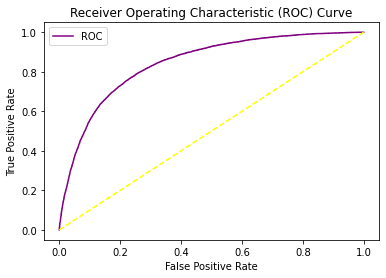

AUC : 0.8428687990843559


In [57]:
plot_roc_curve(fpr, tpr)
print('AUC :',roc_auc_score(y_validation,scores))

## Feature Importance

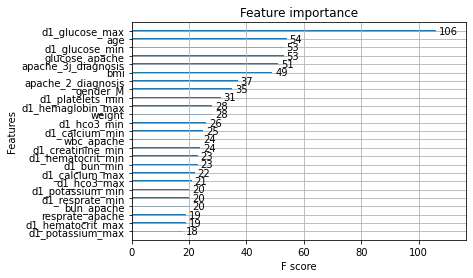

In [58]:
from xgboost import plot_importance
from matplotlib import pyplot
plot_importance(xgb,max_num_features=25)
pyplot.show()

In [59]:
test_data.head()

,encounter_id,age,bmi,elective_surgery,height,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_M,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache
0,144740.0,72.0,29.202947,0.0,152.4,66.262405,110.0,104.01,0.0,0.0,44.000000,1.490000,97.000000,38.0,39.900000,0.0,54.0,31.0,130.000000,36.4,0.0,5.400000,104.0,40.0,104.0,40.0,66.0,38.0,123.0,54.0,123.0,54.0,35.0,15.0,100.0,96.0,149.0,76.0,149.0,76.0,38.7,35.6,59.000000,59.000000,59.000000,59.000000,46.0,44.0,80.00000,80.000000,80.000000,80.000000,19.0,19.0,97.0,96.0,116.000000,116.000000,116.000000,116.000000,36.4,36.4,44.0,40.0,9.8,9.3,1.49,1.44,104.0,97.0,26.0,23.0,14.500000,14.200,42.800000,39.900000,173.000000,173.000000,5.7,4.9,132.0,130.0,5.60000,5.400000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,0.0,5.0
1,141990.0,86.0,28.793947,0.0,175.3,87.817103,117.0,106.01,0.0,0.0,19.000000,0.920000,73.000000,116.0,33.331167,0.0,41.0,53.0,142.000000,36.3,0.0,11.323486,101.0,27.0,101.0,27.0,116.0,56.0,129.0,41.0,129.0,41.0,51.0,14.0,100.0,95.0,181.0,65.0,181.0,65.0,36.8,36.4,85.000000,65.000000,85.000000,65.000000,116.0,104.0,129.00000,94.000000,129.000000,94.000000,31.0,24.0,97.0,95.0,181.000000,119.000000,181.000000,119.000000,36.7,36.7,19.0,19.0,8.5,8.5,1.00,1.00,102.0,73.0,27.0,27.0,11.437005,10.883,35.009011,33.368558,202.383191,191.207332,3.9,3.8,144.0,144.0,11.99516,10.982048,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,0.0,5.0
2,142038.0,72.0,29.043185,0.0,162.6,76.170816,302.0,109.01,0.0,0.0,24.000000,0.770000,84.000000,104.0,34.800000,0.0,117.0,38.0,137.000000,36.4,0.0,4.600000,97.0,61.0,97.0,61.0,98.0,68.0,117.0,77.0,117.0,77.0,49.0,8.0,99.0,85.0,146.0,103.0,146.0,103.0,36.9,35.9,97.000000,97.000000,97.000000,97.000000,98.0,92.0,117.00000,117.000000,117.000000,117.000000,20.0,20.0,99.0,96.0,146.000000,146.000000,146.000000,146.000000,36.4,36.4,24.0,16.0,9.1,8.5,0.82,0.77,141.0,84.0,32.0,31.0,11.800000,11.500,36.600000,34.800000,253.000000,243.000000,3.6,3.6,141.0,137.0,6.60000,4.600000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4.0,6.0,0.0,5.0
3,138628.0,66.0,28.957928,0.0,177.8,91.248194,113.0,501.05,0.0,0.0,27.462629,1.561529,69.118448,110.0,34.041566,0.0,61.0,56.0,136.010372,36.6,1.0,25.597249,77.0,51.0,77.0,51.0,110.0,86.0,110.0,61.0,110.0,61.0,56.0,19.0,99.0,80.0,145.0,95.0,145.0,95.0,37.8,36.6,74.798332,62.167906,74.630567,62.088936,107.0,95.0,91.96863,78.583905,91.971399,78.769904,56.0,28.0,95.0,90.0,132.363828,115.427561,132.520264,115.699856,37.8,37.0,27.0,27.0,9.0,9.0,1.55,1.55,84.0,84.0,24.0,24.0,10.800000,10.

In [60]:
test_data['diabetes_mellitus'] = xgb.predict_proba(test_data)[:,1]

In [62]:
submission=pd.DataFrame({'encounter_id':test_data['encounter_id'],'diabetes_mellitus':test_data['diabetes_mellitus']})
submission.to_csv("submission.csv",index=False)

In [63]:
submission.head()

,encounter_id,diabetes_mellitus
0,144740.0,0.109820
1,141990.0,0.089902
2,142038.0,0.261326
3,138628.0,0.101780
4,141682.0,0.279568
